# Pre Test set

In [1]:
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
from hyperspy.learn.rpca import rpca_godec, orpca
path = 'data/MOLLI_pre_dataset/test/9353628_20140129_MOLLI_1.npy'
vols = np.load(path).transpose(1, 2, 0)
x, y, z = vols.shape
print(f"x is {x} and y is {y} and z is {z}")
M = vols.reshape(x*y, z)
print(M.shape)
# low, sparse, U, S, V = rpca_godec(M, rank=5)
# low_matrix = low.reshape((x, y, z))
# sparse_matrix = sparse.reshape((x, y, z))

# fig = plt.figure(figsize=(11, 3))
# title_font_size=8
# title_pad = 10
# for i in range(z):
#     ax1 = fig.add_subplot(3, 11, 1+i)
#     plt.imshow(vols[..., i], cmap='gray')
#     plt.axis('off')
#     ax1.set_title(f"Timestep{i+1}", fontsize=title_font_size, pad=title_pad)

#     ax2 = fig.add_subplot(3, 11, 12+i)
#     plt.imshow(low_matrix[..., i], cmap='gray')
#     plt.axis('off')

#     ax3 = fig.add_subplot(3, 11, 23+i)
#     plt.imshow(sparse_matrix[..., i], cmap='gray')
#     plt.axis('off')

x is 224 and y is 224 and z is 11
(50176, 11)


In [2]:
import pandas as pd
df = pd.DataFrame()
df_2 = pd.DataFrame()

## Test Metrics

### Original volume

#### First Eigen Component percentage

In [3]:
from scripts.utils import *
orig_path = 'data/MOLLI_pre_dataset/test'
orig_pca_changes = []
for file in sorted(glob.glob(os.path.join(orig_path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    orig_pca_changes.append(org_dis)
print(f"Mean of original PCA is {np.mean(np.array(orig_pca_changes))}")

Mean of original PCA is 0.7867720274668718


#### T1 fitting

In [4]:
import scipy.io
from pathlib import Path
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy import ndimage

title_font_size=8
title_pad = 10
def plot_t1_changes(path, size=(20, 36)):
    fig = plt.figure(figsize=size)
    t1err_square_list = []
    t1err_heart_list = []
    t1err_myo_list = []
    subject_list = []
    
    neighbor = ndimage.generate_binary_structure(2, 2)
    for i, file in enumerate(sorted(glob.glob(os.path.join(path, '*.mat')))):
        subject = Path(file).stem
        subject_list.append(subject)
        fd = scipy.io.loadmat(file)
        SD_err = fd['S']
        areamask = fd['areamask']
        itemindex = np.where(areamask == 1)
        x1, x2 = itemindex[0][0], itemindex[0][-1]
        y1, y2 = itemindex[1][0], itemindex[1][-1]
        epi = fd['epi_BW']
        endo = fd['endo_BW']
        heartmask = ndimage.binary_dilation(epi, structure=neighbor, iterations=3).astype(epi.dtype)
        myomask = heartmask - endo
        
        errmap = SD_err * areamask
        square_SD_err = np.mean(errmap[areamask==1])
        t1err_square_list.append(square_SD_err)
        fig.add_subplot(10, 6, 1+i*6)
        ax = plt.gca()
        im = ax.imshow(errmap[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=50)
        ax.axis('off')
        ax.set_title(f"Average SD error {(square_SD_err):.4f}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        t1_params_pre = fd['pmap_mse']
        a = t1_params_pre[:, :, 0]
        b = t1_params_pre[:, :, 1]
        c = t1_params_pre[:, :, 2]
        t1map = c * (b - 1)
        fig.add_subplot(10, 6, 2+i*6)
        ax = plt.gca()
        im = ax.imshow(t1map[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=2500)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        hearterrmap = SD_err * heartmask
        heartt1map = t1map * heartmask
        heart_SD_err = np.mean(hearterrmap[heartmask==1])
        t1err_heart_list.append(heart_SD_err)

        fig.add_subplot(10, 6, 3+i*6)
        ax = plt.gca()
        im = ax.imshow(hearterrmap[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=50)
        ax.axis('off')
        ax.set_title(f"Average SD error {(heart_SD_err):.4f} in ROI", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        fig.add_subplot(10, 6, 4+i*6)
        ax = plt.gca()
        im = ax.imshow(heartt1map[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=2500)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        myoerrmap = SD_err * myomask
        myot1map = t1map * myomask
        myo_SD_err = np.mean(myoerrmap[myomask==1])
        t1err_myo_list.append(myo_SD_err)

        fig.add_subplot(10, 6, 5+i*6)
        ax = plt.gca()
        im = ax.imshow(myoerrmap[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=50)
        ax.axis('off')
        ax.set_title(f"Average SD error {(myo_SD_err):.4f} in Myocardium", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        fig.add_subplot(10, 6, 6+i*6)
        ax = plt.gca()
        im = ax.imshow(myot1map[x1:x2, y1:y2], cmap='jet', vmin=0, vmax=2500)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)
    plt.subplots_adjust(left=0.0001,right=0.9, top=0.95, bottom=0.1,)
    return fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list

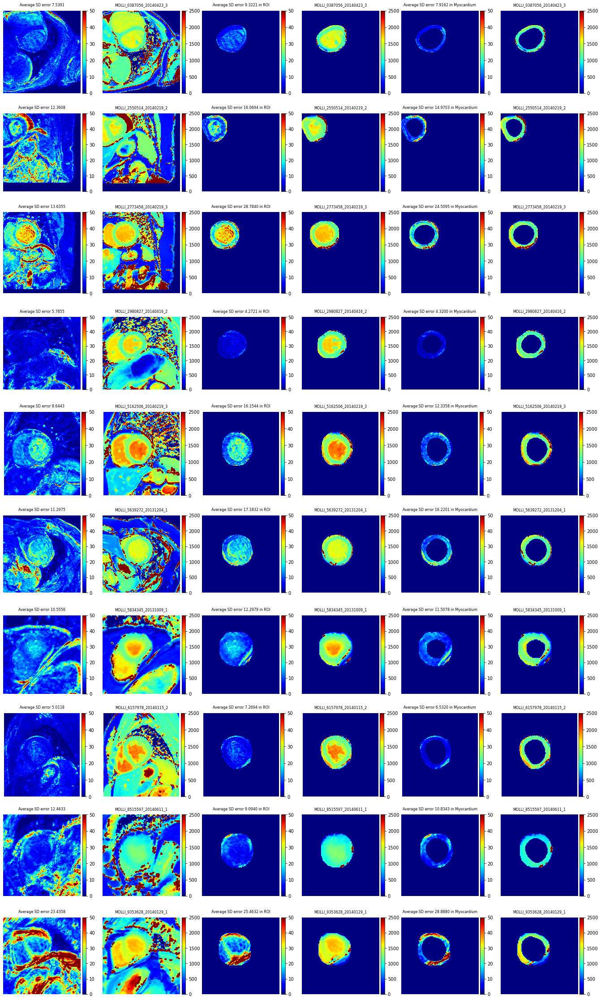

In [5]:
path = "data/MOLLI_pre_dataset/T1_SDerr"

fig, subject_list, orig_t1err_square_list, orig_t1err_heart_list, orig_t1err_myo_list = plot_t1_changes(path)
plt.savefig(f"data/MOLLI_pre_dataset/T1_SDerr/orig_t1err.png", dpi=300)

df['Cases'] = subject_list
df['Raw Square T1err'] = orig_t1err_square_list
df['Raw ROI T1err'] = orig_t1err_heart_list
df['Raw Myo T1err'] = orig_t1err_myo_list
df_2['Cases'] = subject_list
df_2['Raw PCA'] = orig_pca_changes

### Round 1

In [6]:
import voxelmorph_group as vxm  # nopep8
import numpy as np
import glob
import os
jacobian = vxm.losses.Jacobian().loss

In [7]:
r = 1
root = f"results/MOLLI_pre/group/rank_5_5_5_5_5_5_5/nmi/smooth/image_loss_weight1/cycle_loss_weight0.01/weight0.001/bspline/cps4_svfsteps7_svfscale1/e80/test_MOLLI_pre"
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [8]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 1 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 1 PCA is 0.7936123727544484 and std is 0.0240654275945773


#### Jacobian Determination

In [9]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0026211198419332504


#### T1 fitting

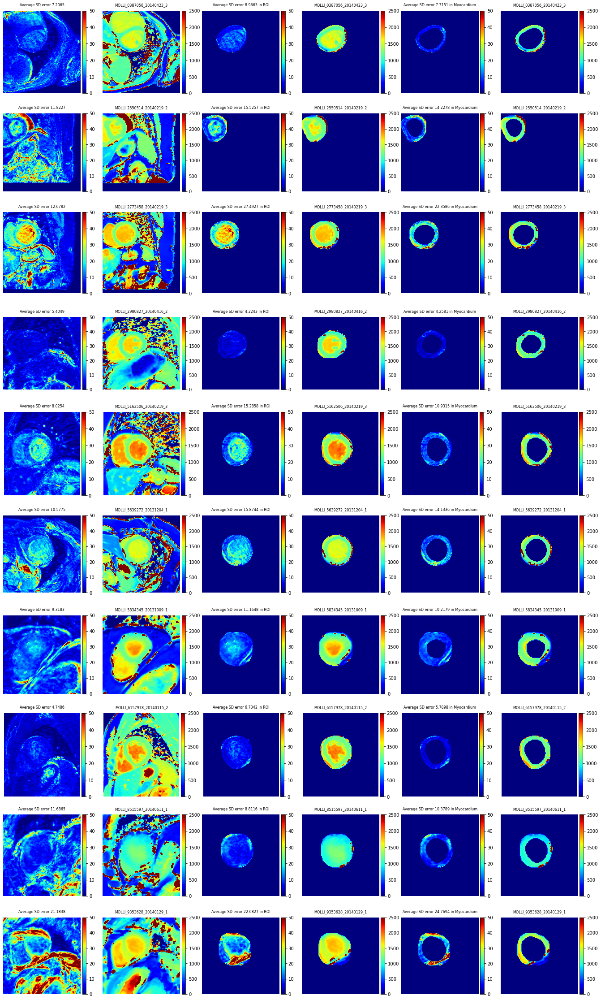

In [10]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R1 Square T1err'] = t1err_square_list
df['R1 ROI T1err'] = t1err_heart_list
df['R1 Myo T1err'] = t1err_myo_list
df_2['R1 PCA'] = pca_changes
df_2['R1 Det'] = mag_det_jac_det_list

### Round 2

In [11]:
r = 2
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [12]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.7967529945391378 and std is 0.023340249584121175


#### Jacobian Determination

In [13]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0017628816422075033


#### T1 fitting

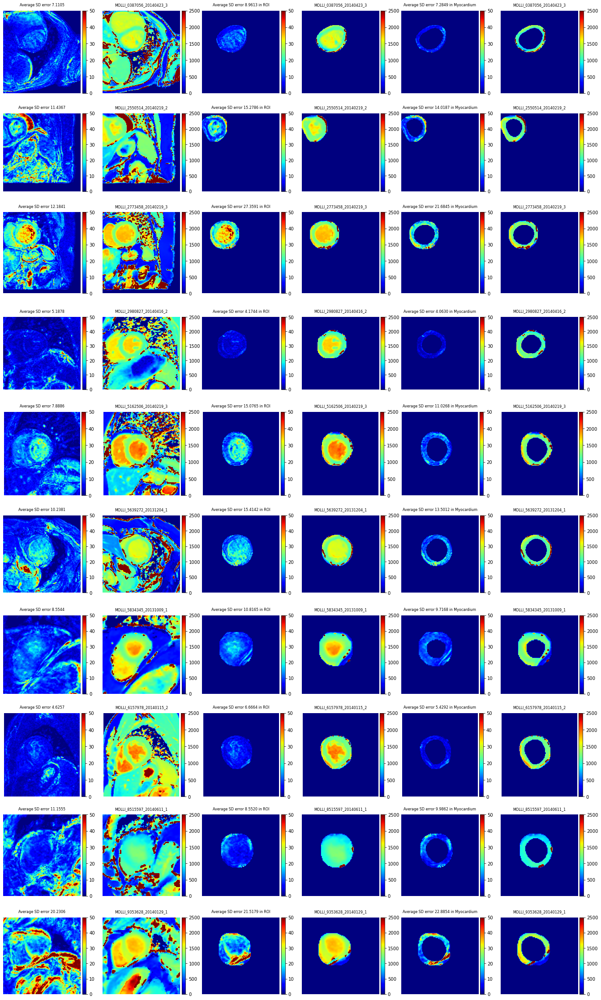

In [14]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R2 Square T1err'] = t1err_square_list
df['R2 ROI T1err'] = t1err_heart_list
df['R2 Myo T1err'] = t1err_myo_list
df_2['R2 PCA'] = pca_changes
df_2['R2 Det'] = mag_det_jac_det_list

### Round 3

In [15]:
r = 3
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [16]:
path = f"{base_path}/moved"
r5_pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    r5_pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(r5_pca_changes))} and std is {np.std(np.array(r5_pca_changes))}")

Mean of Round 2 PCA is 0.7990266444487459 and std is 0.022872551626881208


#### Jacobian Determination

In [17]:
r5_folding_ratio_list = []
r5_mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    r5_folding_ratio_list.append(folding_ratio)
    r5_mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(r5_folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(r5_mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0018309993902221322


#### T1 fitting

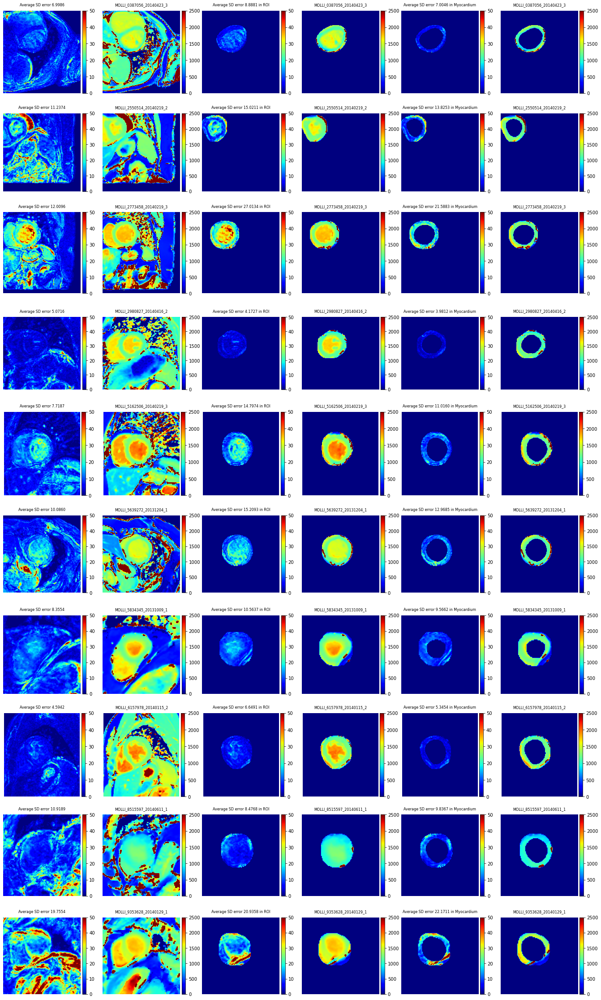

In [18]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R3 Square T1err'] = t1err_square_list
df['R3 ROI T1err'] = t1err_heart_list
df['R3 Myo T1err'] = t1err_myo_list
df_2['R3 PCA'] = pca_changes
df_2['R3 Det'] = mag_det_jac_det_list

### Round 4

In [19]:
r = 4
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [20]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.8000612287800806 and std is 0.022805827647106633


#### Jacobian Determination

In [21]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0011857544304803014


#### T1 fitting

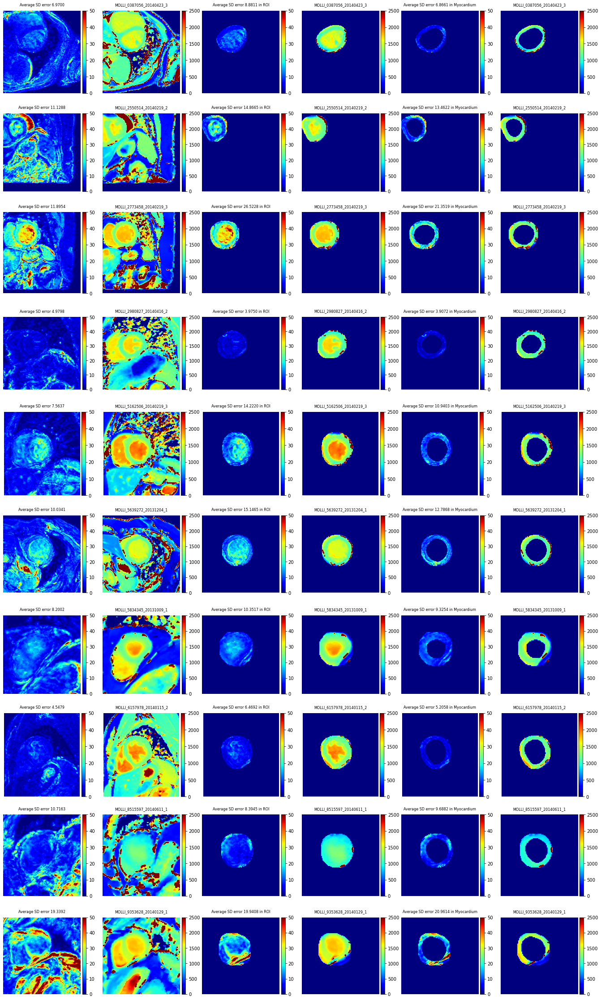

In [22]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R4 Square T1err'] = t1err_square_list
df['R4 ROI T1err'] = t1err_heart_list
df['R4 Myo T1err'] = t1err_myo_list
df_2['R4 PCA'] = pca_changes
df_2['R4 Det'] = mag_det_jac_det_list

### Round 5

In [23]:
r = 5
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [24]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.8010218545580423 and std is 0.02273864914955354


#### Jacobian Determination

In [25]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0010249997721984982


#### T1 fitting

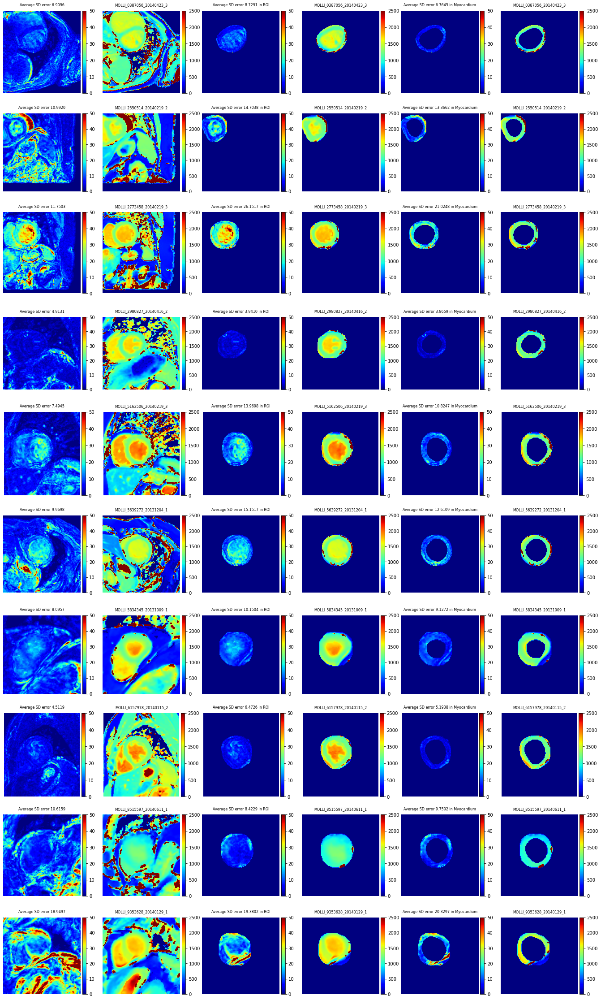

In [26]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R5 Square T1err'] = t1err_square_list
df['R5 ROI T1err'] = t1err_heart_list
df['R5 Myo T1err'] = t1err_myo_list
df_2['R5 PCA'] = pca_changes
df_2['R5 Det'] = mag_det_jac_det_list

### Round 6

In [27]:
r = 6
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [28]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.8016775361612988 and std is 0.0225945125522707


#### Jacobian Determination

In [29]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0008523925207555294


#### T1 fitting

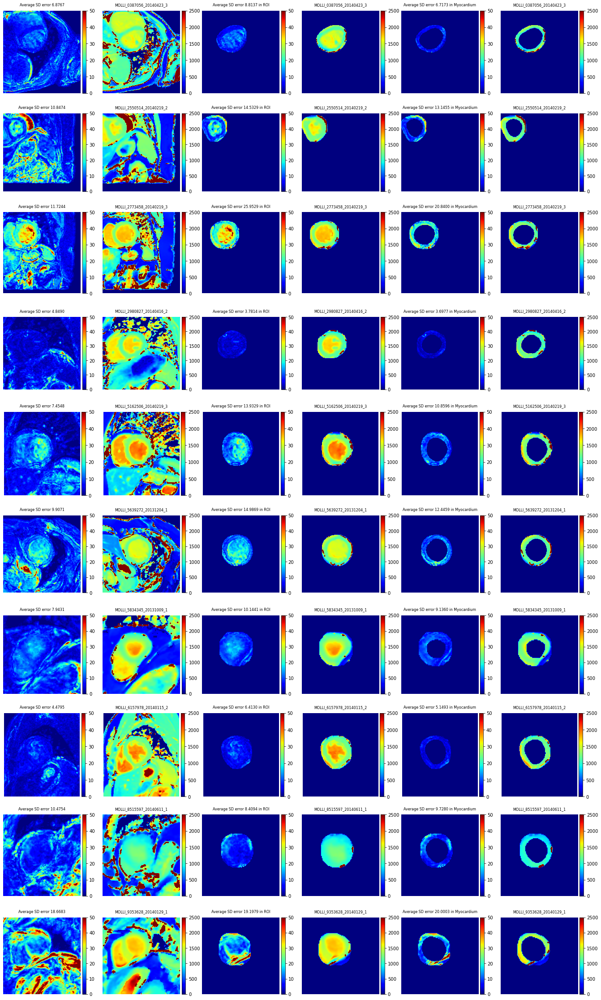

In [30]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R6 Square T1err'] = t1err_square_list
df['R6 ROI T1err'] = t1err_heart_list
df['R6 Myo T1err'] = t1err_myo_list
df_2['R6 PCA'] = pca_changes
df_2['R6 Det'] = mag_det_jac_det_list

### Round 7

In [31]:
r = 7
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [32]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.8021629880668046 and std is 0.022483757836568752


#### Jacobian Determination

In [33]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0007115834159776568


#### T1 fitting

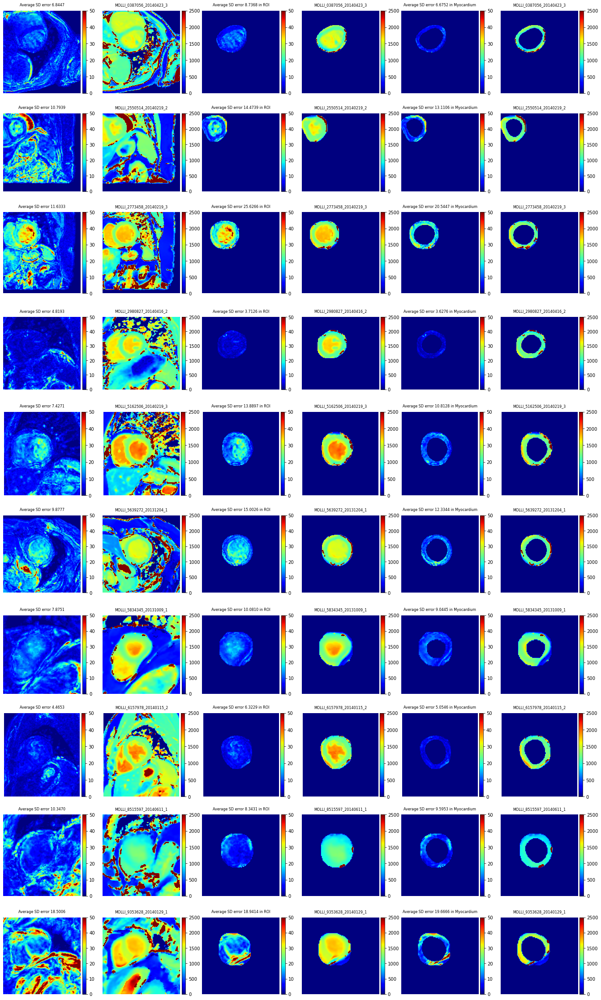

In [34]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df['R7 Square T1err'] = t1err_square_list
df['R7 ROI T1err'] = t1err_heart_list
df['R7 Myo T1err'] = t1err_myo_list
df_2['R7 PCA'] = pca_changes
df_2['R7 Det'] = mag_det_jac_det_list

### Summary

In [35]:
df

,Cases,Raw Square T1err,Raw ROI T1err,Raw Myo T1err,R1 Square T1err,R1 ROI T1err,R1 Myo T1err,R2 Square T1err,R2 ROI T1err,R2 Myo T1err,...,R4 Myo T1err,R5 Square T1err,R5 ROI T1err,R5 Myo T1err,R6 Square T1err,R6 ROI T1err,R6 Myo T1err,R7 Square T1err,R7 ROI T1err,R7 Myo T1err
0,MOLLI_0387056_20140423_3,7.539072,9.322065,7.916214,7.206494,8.966271,7.315086,7.110517,8.961272,7.284874,...,6.866127,6.909555,8.729068,6.764472,6.876699,8.813665,6.717289,6.844715,8.736795,6.675249
1,MOLLI_2550514_20140219_2,12.360840,16.069435,14.970254,11.822665,15.525672,14.227819,11.436714,15.278633,14.018659,...,13.462212,10.992013,14.703840,13.366206,10.847365,14.532944,13.145530,10.793900,14.473905,13.110574
2,MOLLI_2773458_20140219_3,13.635501,28.783973,24.509481,12.678236,27.492683,22.358598,12.184104,27.359102,21.684469,...,21.351937,11.750272,26.151738,21.024813,11.724366,25.952900,20.839989,11.633350,25.626558,20.544700
3,MOLLI_2980827_20140416_2,5.785524,4.272134,4.320001,5.404934,4.224311,4.258136,5.187813,4.174392,4.062953,...,3.907183,4.913087,3.941044,3.865907,4.848986,3.781448,3.697683,4.819301,3.712635,3.627631
4,MOLLI_5162506_20140219_3,8.644283,16.154370,12.335815,8.025396,15.285824,10.931493,7.888589,15.076452,11.026773,...,10.940269,7.494522,13.969815,10.824730,7.454762,13.932921,10.859607,7.427081,13.889679,10.812765
5,MOLLI_5639272_20131204_1,11.297461,17.183207,16.220113,10.577483,15.874375,14.133617,10.238127,15.414239,13.501193,...,12.786790,9.969834,15.151689,12.610852,9.907065,14.986922,12.445911,9.877666,15.002633,12.334422
6,MOLLI_5834345_20131009_1,10.555566,12.297946,11.507841,9.318330,11.164822,10.217872,8.554392,10.816473,9.716795,...,9.325374,8.095716,10.150420,9.127195,7.943083,10.144078,9.136013,7.875074,10.080965,9.044492
7,MOLLI_6157978_20140115_2,5.011841,7.269378,6.532044,4.748632,6.734239,5.789773,4.625731,6.666352,5.429153,...,5.205795,4.511948,6.472620,5.193840,4.479462,6.412974,5.149342,4.465308,6.322914,5.054603
8,MOLLI_8515597_20140611_1,12.463286,9.094014,10.834321,11.686451,8.811596,10.378903,11.155527,8.552047,9.986205,...,9.688172,10.615942,8.422929,9.750218,10.475429,8.409410,9.728020,10.347042,8.343140,9.595340
9,MOLLI_9353628_20140129_1,23.435838,25.463151,28.887980,21.183805,22.682730,24.769363,20.230584,21.517884,22.885373,...,20.961416,18.949715,19.380198,20.329710,18.668291,19.197936,20.000349,18.500550,18.941442,19.666623


In [36]:
df_ROI_desc = pd.DataFrame()
df_ROI_desc['Cases'] = df['Cases']
for round in range(1, 8):
    df_ROI_desc[f'R{round}/Raw ROI %'] = (df['Raw ROI T1err'] - df[f'R{round} ROI T1err']) / df['Raw ROI T1err']
df_ROI_desc.describe()

,R1/Raw ROI %,R2/Raw ROI %,R3/Raw ROI %,R4/Raw ROI %,R5/Raw ROI %,R6/Raw ROI %,R7/Raw ROI %
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,0.056400,0.074792,0.086747,0.107055,0.116791,0.124298,0.131899
std,0.030585,0.040765,0.046111,0.050238,0.054285,0.054254,0.054402
min,0.011194,0.022879,0.023282,0.047300,0.063612,0.054537,0.062783
25%,0.034920,0.049284,0.062446,0.075376,0.079370,0.096301,0.101891
50%,0.049313,0.063161,0.075932,0.094314,0.100526,0.116333,0.128550
75%,0.075531,0.097949,0.107486,0.119347,0.130979,0.135089,0.137884
max,0.109194,0.154940,0.177799,0.216875,0.238892,0.246050,0.256123


In [37]:
df_Myo_desc = pd.DataFrame()
df_Myo_desc['Cases'] = df['Cases']
for round in range(1, 8):
    df_Myo_desc[f'R{round}/Raw Myo %'] = (df['Raw Myo T1err'] - df[f'R{round} Myo T1err']) / df['Raw Myo T1err']
df_Myo_desc.describe()

,R1/Raw Myo %,R2/Raw Myo %,R3/Raw Myo %,R4/Raw Myo %,R5/Raw Myo %,R6/Raw Myo %,R7/Raw Myo %
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,0.088042,0.120238,0.137170,0.155544,0.165300,0.174702,0.183986
std,0.041763,0.051694,0.054729,0.060376,0.064753,0.063757,0.064926
min,0.014321,0.059502,0.076485,0.095560,0.100062,0.102111,0.114357
25%,0.056180,0.078649,0.095806,0.107624,0.110986,0.127431,0.132359
50%,0.099926,0.110690,0.117172,0.130740,0.143834,0.150585,0.161018
75%,0.113790,0.164629,0.178432,0.199691,0.206371,0.210286,0.223152
max,0.142572,0.207789,0.232514,0.274390,0.296257,0.307658,0.319211


In [38]:
df_PCA_desc = pd.DataFrame()
df_PCA_desc['Cases'] = df_2['Cases']
for round  in range(1, 8):
    df_PCA_desc[f'R{round}/Raw PCA %'] = (df_2[f'R{round} PCA'] - df_2['Raw PCA']) / df_2['Raw PCA']
df_PCA_desc.describe()

,R1/Raw PCA %,R2/Raw PCA %,R3/Raw PCA %,R4/Raw PCA %,R5/Raw PCA %,R6/Raw PCA %,R7/Raw PCA %
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,0.008760,0.012788,0.012788,0.017023,0.018248,0.019089,0.019713
std,0.002861,0.004215,0.004215,0.005740,0.005971,0.006301,0.006593
min,0.006356,0.009203,0.009203,0.012006,0.013292,0.014263,0.014525
25%,0.006616,0.009448,0.009448,0.012912,0.013855,0.014460,0.014948
50%,0.007552,0.011134,0.011134,0.014410,0.015705,0.016312,0.016779
75%,0.010256,0.015360,0.015360,0.020124,0.021514,0.022458,0.023324
max,0.014105,0.019886,0.019886,0.026780,0.028354,0.029827,0.031048


In [39]:
df_det = df_2[['R1 Det', 'R2 Det', 'R3 Det', 'R4 Det', 'R5 Det', 'R6 Det', 'R7 Det']]
df_det.describe()

,R1 Det,R2 Det,R3 Det,R4 Det,R5 Det,R6 Det,R7 Det
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,0.002621,0.001763,0.001763,0.001186,0.001025,0.000852,0.000712
std,0.000391,0.000233,0.000233,0.000128,0.000065,0.000070,0.000044
min,0.001805,0.001283,0.001283,0.000871,0.000903,0.000681,0.000624
25%,0.002382,0.001650,0.001650,0.001167,0.000993,0.000850,0.000690
50%,0.002721,0.001765,0.001765,0.001190,0.001015,0.000862,0.000717
75%,0.002834,0.001870,0.001870,0.001228,0.001072,0.000876,0.000728
max,0.003158,0.002102,0.002102,0.001358,0.001124,0.000954,0.000786
